In [1]:
#Implementando funções de substituição direta e reversa, e da decomposicao LU e QR.

#EXERCICIOS COMEÇAM NA CÈLULA ABAIXO DESTA.

function subs_reversa(U,b)
    m,n = size(U)
    x = zeros(n)
    for i in reverse(1:n)
        coeficientes = U[i,:]
        resultado = b[i]
        for j in reverse(1:n)
            resultado = resultado - x[j]*coeficientes[j]
        end
        resultado = resultado/coeficientes[i]
        x[i] = resultado
    end
    return x
end

function subs_direta(L,b)
    m,n = size(L)
    x = zeros(n)
    for i in 1:n
        coeficientes = L[i,:]
        resultado = b[i] 
        for j in 1:n
            resultado = resultado - x[j]*coeficientes[j]
        end
        resultado = resultado/coeficientes[i]
        x[i] = resultado
    end
    return x
end

function dec_LU(A) #recebe matriz quadrada
    m,n = size(A)
    L  = zeros(m,n)
    U = zeros(m,n)
    #porque na linha acima eu não posso fazer U = L? isso parece juntar a referencia das duas variaveis. Esquisito.
    for i in 1:n
        pivo = A[i,i]
        L[:,i] = (1/pivo) * A[:,i]
        U[i,:] = A[i,:]
        A -= ( L[:,i] * U[i,:]' )
    end
    return L,U
end

function dec_QR(A)
    m,n = size(A)
    R = zeros(m,n)
    Q = zeros(m,n)

    for i in 1:n
        vetor = A[:,i]
    
        for j in 1:(i-1)
            u = Q[:,j] #pega vetor já ortogonalizado 'u'
            prod_interno = (vetor')*u #ve de quantos 'u' o 'vetor' é composto
            R[j,i] = prod_interno #adiciona na matriz R
            vetor-=(prod_interno * u) #cria o ortogonal a u
        end
        norma = norm(vetor)
        R[i,i] = norma
        Q[:,i] = vetor/norma
    end

    return Q,R
end


dec_QR (generic function with 1 method)

In [13]:
using LinearAlgebra


##EXERCICIO 1
#Matriz de usuários:
usuarios = [ 0.9 0.1
            0.8 0.2
            0.3 0.7
            0.6 0.4
            0 1]

#matriz de filmes
filmes = [ 0.9 0.1
        0.1 0.9
        0.5 0.5
        0 1
        0.2 0.8]

# Não entendi muito bem o significado de uma tabela usuários x filmes.
# Modelei então criando uma tabela com distância entre as preferências de cada usuário e as classificações dos filmes.
# Logo, quanto menor o valor, mais indicado é o filme para o usuário
tabela = zeros(5,5)
for j in range(1,5)
    for k in range(1,5)
        tabela[j,k] = sqrt((usuarios[j,1] - filmes[k,1])^2 + (usuarios[j,2] - filmes[k,2])^2)
    end 
end
println("\tEXERCICIO 1
    \nTabela de distâncias entre usuários e filmes")
println("USUARIO|     Titanic |      Rocky    |     Hobbit    |   FIght Club    | Jurassic Park|")
char = 'A' -1
for i in range(1,5)
    println("     ", char+i," | ",tabela[i,1:5])
end
println("\n\n")
#Calculando distancias entre as preferencias de cada usuário

dist_usuario = zeros(5,5)
for i in range(1,5)
    for j in range(1,5)
        dist_usuario[i,j] = sqrt((usuarios[i,1]-usuarios[j,1])^2 + (usuarios[i,2]-usuarios[j,2])^2) 
    end
end
println("Na matriz abaixo, vemos que o menor valor da distância é entre os usuários A e B! Valores na diagonal não contam, por serem distâncias com o próprio usuario")
dist_usuario

	EXERCICIO 1
    
Tabela de distâncias entre usuários e filmes
USUARIO|     Titanic |      Rocky    |     Hobbit    |   FIght Club    | Jurassic Park|
     A | [0.0, 1.1313708498984762, 0.5656854249492381, 1.2727922061357855, 0.9899494936611666]
     B | [0.1414213562373095, 0.9899494936611666, 0.42426406871192857, 1.1313708498984762, 0.8485281374238571]
     C | [0.8485281374238571, 0.28284271247461906, 0.282842712474619, 0.42426406871192857, 0.14142135623730953]
     D | [0.42426406871192857, 0.7071067811865476, 0.14142135623730948, 0.848528137423857, 0.565685424949238]
     E | [1.2727922061357855, 0.1414213562373095, 0.7071067811865476, 0.0, 0.282842712474619]



Na matriz abaixo, vemos que o menor valor da distância é entre os usuários A e B! Valores na diagonal não contam, por serem distâncias com o próprio usuario


5×5 Matrix{Float64}:
 0.0       0.141421  0.848528  0.424264  1.27279
 0.141421  0.0       0.707107  0.282843  1.13137
 0.848528  0.707107  0.0       0.424264  0.424264
 0.424264  0.282843  0.424264  0.0       0.848528
 1.27279   1.13137   0.424264  0.848528  0.0

In [3]:
#EXERCICIO 2


# a) Significa que eles não possuem nenhum sintoma em comum.

# b) Significa que nenhum paciente teve os 2 sintomas em questão ao mesmo tempo.

# c) Significa que os dois pacientes tiveram os mesmos sintomas, ou não tiveram nenhum.

# d) Significa os dois sintomas sempre se manifestaram conjuntamente nos pacientes.

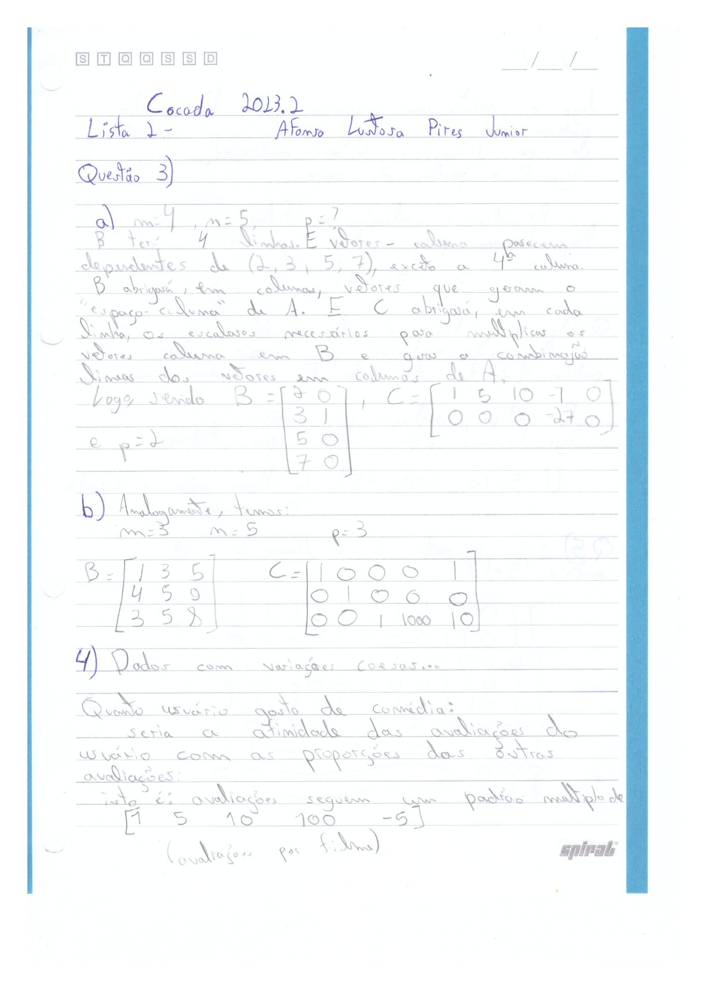
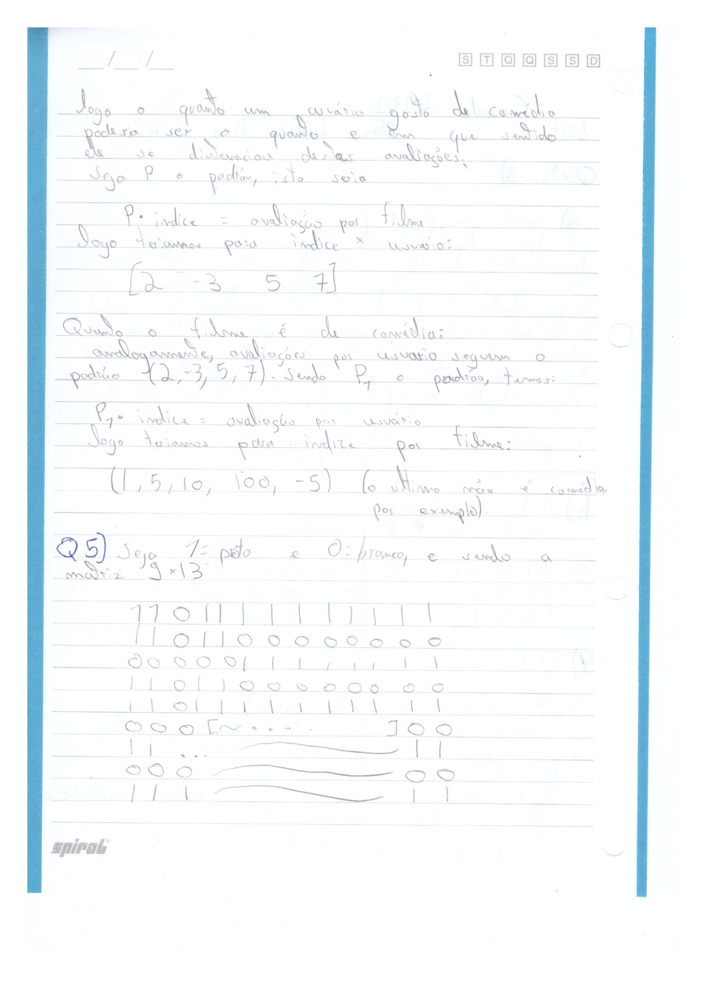
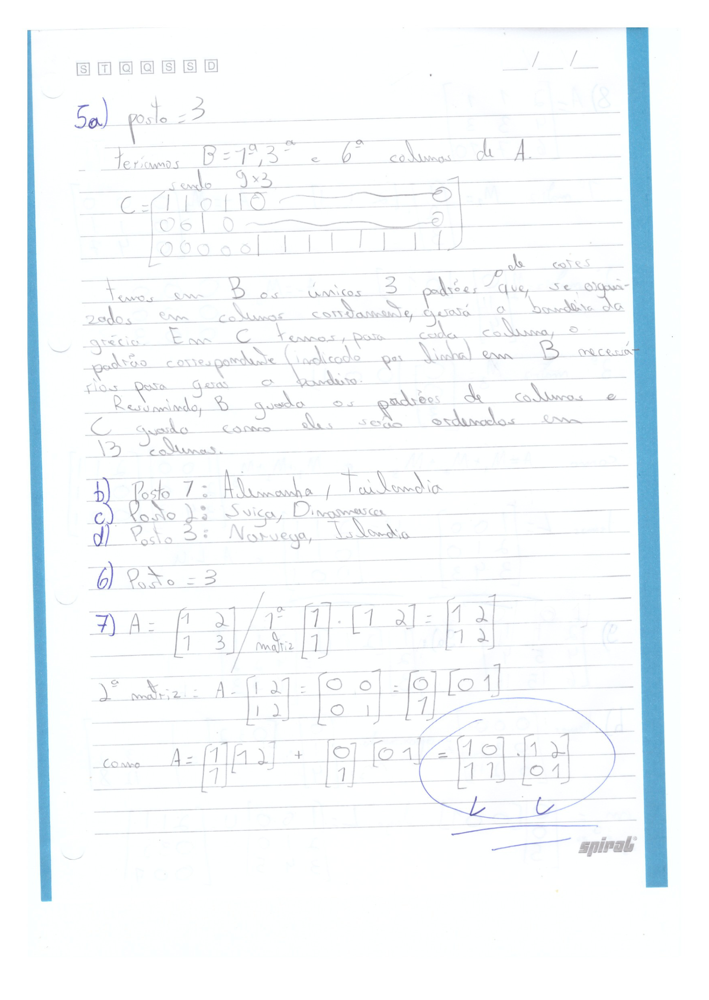
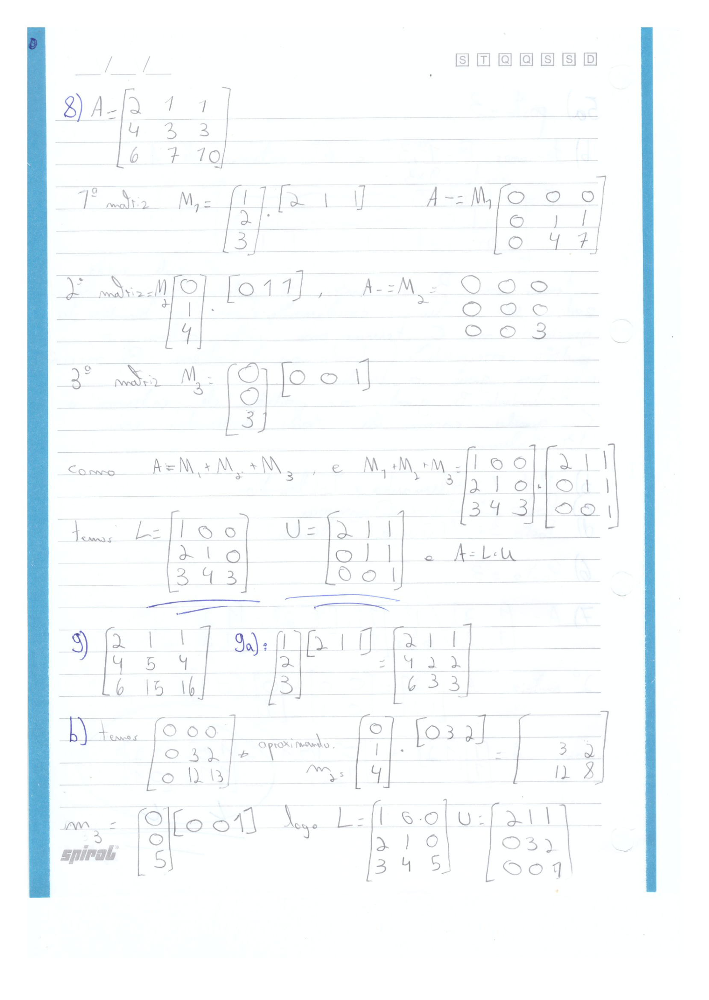

In [12]:
#Exercicio 9

#ITEM 9b)     ( já fiz no caderno, mas farei aqui novamente)
A = [2 1 1
    4 5 4 
    6 15 16]
L,U = dec_LU(A)
e1 = [1,0,0]
e2 = [0,1,0]
e3 = [0,0,1]
print("ITEM 9b) \nL para L*U = A\n")
display(L)
print(" \nU para L*U = A\n")
display(U)

#ITEM 9c)        Resolvendo o sistema LUx = e1
c = subs_reversa(U,subs_direta(L,e1))

#ITEM 9d)        Resolvendo o sistema LUx = e2
d = subs_reversa(U,subs_direta(L,e2))

#ITEM 9e)        Resolvendo o sistema LUx = e2
e = subs_reversa(U,subs_direta(L,e3))

#ITEM 9f) Definindo a matriz inversa pelos valores encontrados em c,d & e

A_inv  = [c d e]  
#definindo matriz identidade 3x3
Id3 = Matrix(1.0I,3,3)
#testando

print("\n ITEM 9f)\n Seja c,d,e os vetores encontrados nas questões anteriores.
    \n Se [c d e] (dispostos em colunas) é a inversa de A, alogo A * [c d e] ≈ Identidade 3x3.
    \n Teste para A * [c d e] ≃ Id_3x3:  ", A*A_inv ≈ Id3)
print("\n\nLogo, a inversa de A será a Matriz [c d e] :\n\n")
display(A_inv)


#ITEM 9g)      Escreverei a função que retorna a inversa de A=LU, dados L e U

function inversa(L,U)
    #seja m,n o tamanho da matriz A
    m,n = size(L*U)
    #definindo matriz identidade m por n
    e = Matrix(I,m,n)
    #inicializando matriz vazia
    inversa = zeros(m,n)

    for i in 1:n    #para cada coluna
        #coluna atual = resolucao do sistema LUx=b, sendo b  a i-ésima coluna da Matriz identidade m por n
        inversa[:,i] = subs_reversa(U,subs_direta(L,e[:,i]))
    end
    return inversa
        
end

#ITEM 9h)
#calculando a determinante de A com base em L e U
det_A = 1 
for i in 1:3
    det_A *= L[i,i] * U[i,i]
end

print("Determinante de A = ",det_A)

#ITEM 9i)
# o código seria:
# dadas as matrizes L,U
function determinante(L,U)
    m,n = size(L)
    resultado = 1
    #para cada linha/coluna
    for i in 1:n
        #resultado será o produtorio da i-ésima coluna e linha de L  vezes  i-ésima linha e coluna de U
        resultado *= L[i,i] * U[i,i]
    end
    return resultado
end

ITEM 9b) 
L para L*U = A


3×3 Matrix{Float64}:
 1.0  0.0  0.0
 2.0  1.0  0.0
 3.0  4.0  1.0

 
U para L*U = A


3×3 Matrix{Float64}:
 2.0  1.0  1.0
 0.0  3.0  2.0
 0.0  0.0  5.0


 ITEM 9f)
 Seja c,d,e os vetores encontrados nas questões anteriores.
    
 Se [c d e] (dispostos em colunas) é a inversa de A, alogo A * [c d e] ≈ Identidade 3x3.
    
 Teste para A * [c d e] ≃ Id_3x3:  true

Logo, a inversa de A será a Matriz [c d e] :



3×3 Matrix{Float64}:
  0.666667  -0.0333333  -0.0333333
 -1.33333    0.866667   -0.133333
  1.0       -0.8         0.2

Determinante de A = 30.0

determinante (generic function with 1 method)

In [20]:

# EXERCICIO 10)
# É possivel achar uma decomposição de uma Matriz simétrica tal que 
# A = L * D * L', sendo D uma matriz diagonal.

# Acontece que, se na matriz D (que guarda o valor dos pivots da decomposição) houver um valor negativo, não é possível fazer
# a decomposição em A = L * L'. Porque a idéia de tal decomposição é colocar as devidas raizes quadradas dos pivots de D em L,
# de forma que ao fazer L * L' teríamos a composição do pivot novamente, gerando A.



#Recebe A e retorna:
    # L e D caso haja pivô negativo. 
    # Somente L caso contrário. 
function alg_LU_simetrica(A)

    m,n = size(A)
    L  = zeros(m,n)
    tem_negativo = false
    #nao precisamos inicializar U!
    #mas precisamos de um vetor que será os pivôs para cada laço.
    pivos = zeros(n)
    for i in 1:n
        pivos[i] = 1/A[i,i]
        
        if (pivos[i]<0)
            tem_negativo = true
        end
        L[:,i] = A[:,i]
        A -= ( L[:,i] * (L[:,i])' * pivos[i] )
    end

    if(tem_negativo)
        return L,diagm(pivos) #retornando L e D
    else
        return L*sqrt(diagm(pivos)),0 #retornando L * raiz de D
    end
end

#testando a função
A = [2 -1 0
    -1 2 -1
    0 -1 2]

print("\tEXERCICIO 10
    \n Seja A:")
display(A)

L,D = alg_LU_simetrica(A)

if D==0

    print("\n\nA terá pivôs positivos! Logo A pode ser decomposto em A = L*L'.
    \n Teremos a norma de A - L*L' = ", norm(A - L*L'))
else
    print("\n\nA não terá pivôs positivos. Logo A pode ser decomposto somente em A = L*D*L'.
    \n Teremos a norma de A - L*D*L' = ", norm(A - L*L'))
end


	EXERCICIO 10
    
 Seja A:

3×3 Matrix{Int64}:
  2  -1   0
 -1   2  -1
  0  -1   2



A terá pivôs positivos! Logo A pode ser decomposto em A = L*L'.
    
 Teremos a norma de A - L*L' = 7.195067539997724e-16

In [6]:
#EXERCICIO 11

# Se AZ = LLQU, logo A = LLQUZ', logo Ax = Lb será LLUQZ'x = Lb
# isto é, LUQZ'x = b. Este é o sistema que precisamos resolver.
# Como Qx = b é facilmente resolúvel, visto que Q*Q' = I, usaremos uma série de resoluções lineares,
# alternando o uso da inversa de Q e Z e substituições diretas/inversas para L e U. Isto é:

# Se LQUZ'x = b,    seja t1 = QUZ'x, logo L * t1 = b       (temos t1)
# e seja UZ'x = t2, logo Q*t2 = t1      (temos t2)
# e seja Z'x = t3, logo U * t3 = t2 (temos t3)
# e logo teremos Z'x = t3, resultando em x = Z*t3
b = [1,2,3]

function resolve_sl(Z,Q,L,U,b)
    t1 = subs_direta(L,b)
    t2 = Q' * t1
    t3 = subs_reversa(U,t2)
    x = Z*t3
    return x
end

# Para testar, geraremos 2 matrizes ortogonais e L,U's a partir de decomposições QR. Calcularemos A.
Z,L = dec_QR(randn(3,3))
L = L'
Q,U = dec_QR(randn(3,3))
A = L*L*Q*U*Z'
#definindo b
b = [ 3, 4 , 7]
#guardando a resposta
resposta = A\(L*b)
# testando o algoritmo
x = resolve_sl(Z,Q,L,U,b)
print("Diferença entre o x encontrado pelo algoritmo e o dado por A\\(L*b):")
display(norm(x - resposta))

print("\n Que é quase 0.")

Diferença entre o x encontrado pelo algoritmo e o dado por A\(L*b):

3.2709212810858e-15


 Que é quase 0.

#Exercicio 25a)
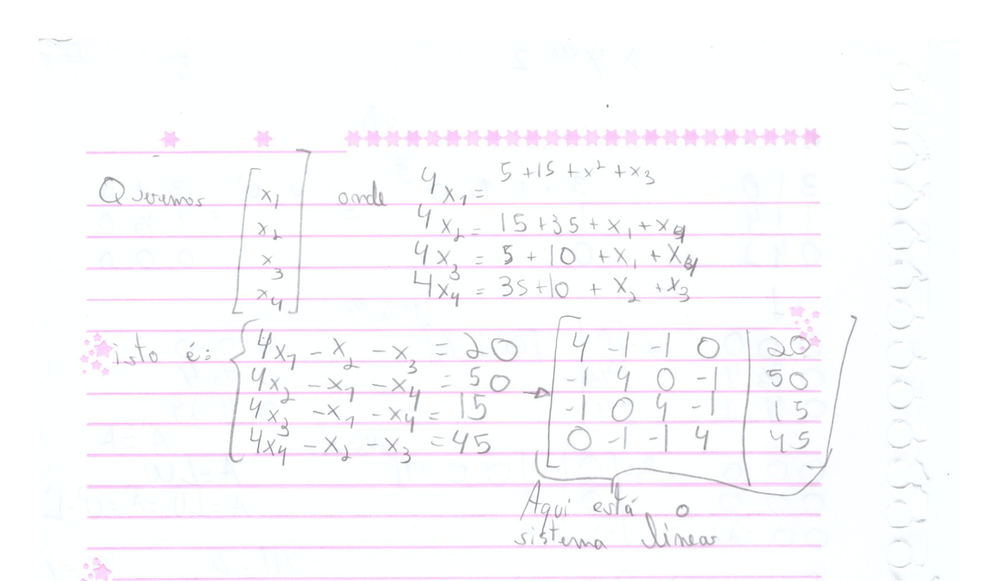